### TASK 4


## Load data

### Load images

50 images resized and saved to 'resized_images'


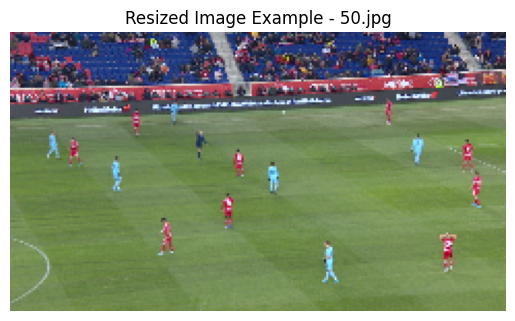

In [54]:
import os
import random
import cv2
import matplotlib.pyplot as plt

IMAGES_PATH = "images"
RESIZED_PATH = "resized_images"
os.makedirs(RESIZED_PATH, exist_ok=True)

NUM_IMAGES = 50
scale_factor = 1/8

def load_and_resize_images(folder, num_images=NUM_IMAGES, scale=scale_factor):
    all_images = os.listdir(folder)
    sample_images = random.sample(all_images, num_images)

    resized_images = {}
    for img_name in sample_images:
        img_path = os.path.join(folder, img_name)
        img = cv2.imread(img_path)

        if img is None:
            continue

        new_w = int(img.shape[1] * scale)
        new_h = int(img.shape[0] * scale)
        resized_img = cv2.resize(img, (new_w, new_h))

        save_path = os.path.join(RESIZED_PATH, img_name)
        cv2.imwrite(save_path, resized_img)

        resized_images[img_name] = resized_img

    return resized_images

resized_images_dict = load_and_resize_images(IMAGES_PATH)

print(f"{len(resized_images_dict)} images resized and saved to '{RESIZED_PATH}'")

sample_key = list(resized_images_dict.keys())[0]
plt.imshow(cv2.cvtColor(resized_images_dict[sample_key], cv2.COLOR_BGR2RGB))
plt.title(f"Resized Image Example - {sample_key}")
plt.axis("off")
plt.show()


### Load annotations


loading annotations into memory...
Done (t=0.32s)
creating index...
index created!


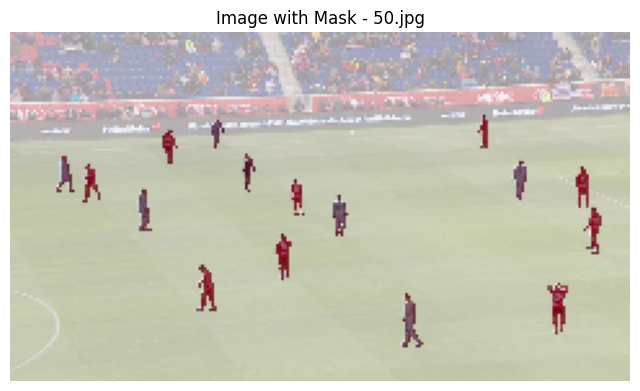

In [55]:
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np
from pycocotools.coco import COCO

ANNOT_PATH = "annotations/instances_default.json"
coco = COCO(ANNOT_PATH)

filename_to_id = {img["file_name"]: img["id"] for img in coco.dataset["images"]}

def get_mask_for_image(filename, coco, category_id=1):
    image_id = filename_to_id.get(filename)
    if image_id is None:
        return None
    
    ann_ids = coco.getAnnIds(imgIds=image_id, catIds=[category_id])
    anns = coco.loadAnns(ann_ids)
    
    img_info = coco.loadImgs(image_id)[0]
    mask = np.zeros((img_info["height"], img_info["width"]), dtype=np.uint8)
    
    for ann in anns:
        mask = np.maximum(mask, coco.annToMask(ann))
    
    return mask

sample_filename = sample_key
image_resized = resized_images_dict[sample_filename]

mask = get_mask_for_image(sample_filename, coco)
if mask is not None:
    mask_resized = cv2.resize(mask, (image_resized.shape[1], image_resized.shape[0]),
                              interpolation=cv2.INTER_NEAREST)
    
    plt.figure(figsize=(8,6))
    plt.imshow(cv2.cvtColor(image_resized, cv2.COLOR_BGR2RGB))
    plt.imshow(mask_resized, cmap="Reds", alpha=0.6)
    plt.title(f"Image with Mask - {sample_filename}")
    plt.axis("off")
    plt.show()
else:
    print(f"No mask found for {sample_filename}")


## Creating Features

### Feature 1: RGB Color

- Feature vector هر پیکسل: `[R, G, B]`
- ساده و سریع
- محدودیت: ممکنه بازیکن و زمین هم‌رنگ باشند → دقت پایین
- برای ارزیابی: می‌توان کا مین ساده روی این ویژگی انجام داد و خروجی خوشه بندی را بصری نمایش داد


### Feature 2: Position (X,Y)

- هر پیکسل شامل مختصات خودش در تصویر است.
- Feature vector هر پیکسل: `[X, Y]`
- مزیت: بازیکن‌ها معمولاً در نواحی مشخص تصویر هستند، پس اضافه کردن موقعیت می‌تواند کلاسترینگ را دقیق‌تر کند.
- محدودیت: زاویه دوربین یا بازیکن‌ها در مناطق مختلف می‌توانند باعث کاهش دقت شوند.


### Feature 3: RGB + Position (X,Y)

- ترکیب کانال‌های رنگی هر پیکسل با موقعیت آن در تصویر.
- Feature vector هر پیکسل: `[R, G, B, X, Y]`
- مزیت: 
  - رنگ‌ها اطلاعات ظاهری بازیکن‌ها و زمین را می‌دهند.
  - موقعیت کمک می‌کند که بازیکن‌ها که معمولاً در نواحی مشخص هستند بهتر جدا شوند.
- محدودیت:
  - زاویه دوربین یا حرکت بازیکن‌ها در مناطق مختلف تصویر ممکن است اثر موقعیت را کاهش دهد.


### Feature 4: Sobel Edge

- Sobel Operator یک فیلتر گرادیان است که تغییرات شدت پیکسل‌ها در جهت X و Y را محاسبه می‌کند.
- Feature vector هر پیکسل: `[Sobel_magnitude]`
- مزیت:
  - لبه‌ها اطلاعات مهمی از بازیکن‌ها و خطوط زمین می‌دهند.
  - کمک می‌کند نواحی با تغییر رنگ ناگهانی بهتر از پس‌زمینه جدا شوند.
- محدودیت:
  - نویز می‌تواند تاثیر گذار باشد؛ قبل از اعمال Sobel معمولاً Gaussian Blur توصیه می‌شود.


### Feature 5: HOG (Histogram of Oriented Gradients)

- HOG یک توصیف‌گر ویژگی مبتنی بر گرادیان است که توزیع جهت لبه‌ها را در نواحی محلی تصویر محاسبه می‌کند.

- Feature vector هر تصویر: [Histogram of gradient orientations]

- مزیت‌ها:

- مقاوم به تغییرات روشنایی و نورپردازی، چون به جای رنگ روی ساختار لبه‌ها تمرکز دارد.

- اطلاعات غنی درباره شکل و کانتور بازیکن‌ها فراهم می‌کند.

- پرکاربرد در تشخیص اشیاء و جداسازی foreground از background.

- محدودیت‌ها:

- بردار ویژگی معمولاً ابعاد خیلی بزرگی دارد (پر هزینه برای حافظه و محاسبات).

- در صورت تغییر مقیاس یا چرخش شدید اشیاء، عملکرد ضعیف‌تر می‌شود.

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import local_binary_pattern
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# # -----------------------
# # 1. Position features
# # -----------------------
# def add_position(img):
#     h, w, _ = img.shape
#     pos_x = np.tile(np.arange(w), (h,1)) / w
#     pos_y = np.tile(np.arange(h).reshape(h,1), (1,w)) / h
#     img_pos = np.dstack([img.astype(np.float32)/255.0, pos_x, pos_y])
#     return img_pos

# # -----------------------
# # 2. Edge features (Sobel)
# # -----------------------
# def sobel_edges(img_rgb):
#     img_gray = cv2.cvtColor((img_rgb[:,:,:3]*255).astype(np.uint8), cv2.COLOR_RGB2GRAY)
#     sobel_x = cv2.Sobel(img_gray, cv2.CV_64F,1,0,ksize=3)
#     sobel_y = cv2.Sobel(img_gray, cv2.CV_64F,0,1,ksize=3)
#     edge = np.sqrt(sobel_x**2 + sobel_y**2)
#     edge = (edge - edge.min()) / (edge.max()-edge.min()+1e-8)
#     return edge[..., np.newaxis]

# # -----------------------
# # 3. Texture features (LBP)
# # -----------------------
# def lbp_texture(img_rgb, radius=1, n_points=8):
#     img_gray = cv2.cvtColor((img_rgb[:,:,:3]*255).astype(np.uint8), cv2.COLOR_RGB2GRAY)
#     lbp = local_binary_pattern(img_gray, n_points, radius, method='uniform')
#     lbp = (lbp - lbp.min()) / (lbp.max()-lbp.min()+1e-8)
#     return lbp[..., np.newaxis]

# # -----------------------
# # 4. Combine all features with weighting
# # -----------------------
# def compute_features_weighted(img, visualize=True):
#     img_pos = add_position(img)
#     edge = sobel_edges(img)
#     texture = lbp_texture(img)
    
#     # Weighting: RGB=0.5, position=0.1, edge=1.0, texture=1.0
#     features = np.dstack([
#         img_pos[:,:,:3]*0.5,   # RGB
#         img_pos[:,:,3:]*0.1,   # position
#         edge*1.0,              # Sobel
#         texture*1.0            # LBP
#     ])
    
#     if visualize:
#         plt.figure(figsize=(15,5))
#         plt.subplot(1,4,1)
#         plt.imshow(img)
#         plt.title("Original RGB")
#         plt.axis("off")
        
#         plt.subplot(1,4,2)
#         plt.imshow(img_pos[:,:,:3])
#         plt.title("Normalized RGB")
#         plt.axis("off")
        
#         plt.subplot(1,4,3)
#         plt.imshow(edge, cmap="gray")
#         plt.title("Sobel Edge")
#         plt.axis("off")
        
#         plt.subplot(1,4,4)
#         plt.imshow(texture, cmap="gray")
#         plt.title("LBP Texture")
#         plt.axis("off")
        
#         plt.tight_layout()
#         plt.show()
    
#     return features.reshape(-1, features.shape[2])
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from skimage.feature import local_binary_pattern

def create_hybrid_features_colored(image, weights):
    lab_image = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    h, w, _ = image.shape
    y_coords, x_coords = np.mgrid[0:h, 0:w]
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    sobel_x = cv2.Sobel(gray_image, cv2.CV_64F, 1, 0, ksize=3)
    sobel_y = cv2.Sobel(gray_image, cv2.CV_64F, 0, 1, ksize=3)
    edge_feature = np.sqrt(sobel_x**2 + sobel_y**2)
    
    texture_feature = local_binary_pattern(gray_image, P=8, R=1, method='uniform')
    
    features = np.zeros((h, w, 7))
    features[:, :, 0:3] = lab_image
    features[:, :, 3] = x_coords
    features[:, :, 4] = y_coords
    features[:, :, 5] = edge_feature
    features[:, :, 6] = texture_feature
    
    reshaped_features = features.reshape(-1, 7)
    
    scaler = StandardScaler()
    scaled_features = scaler.fit_transform(reshaped_features)
    
    scaled_features[:, 3] *= weights.get('spatial', 1.0)
    scaled_features[:, 4] *= weights.get('spatial', 1.0)
    scaled_features[:, 5] *= weights.get('edge', 1.0)
    scaled_features[:, 6] *= weights.get('texture', 1.0)
    
    return scaled_features
feature_weights = {'spatial':0.3, 'edge':1.5, 'texture':1.0}
sample_img_bgr = resized_images_dict[sample_key]
features = create_hybrid_features_colored(sample_img_bgr, feature_weights)

### Hybrid Feature Extraction (Colored Images)

برای هر پیکسل تصویر، یک بردار ویژگی 7 بعدی ساخته شد:

1. **Color (3D)**: کانال‌های L, A, B از فضای LAB → اطلاعات رنگ و روشنایی.
2. **Spatial (2D)**: مختصات (x, y) → کمک به خوشه‌بندی پیکسل‌های نزدیک به هم.
3. **Edge (1D)**: شدت لبه با Sobel → تشخیص مرز بازیکن و زمینه.
4. **Texture (1D)**: Local Binary Pattern (LBP) → استخراج بافت بدن بازیکن.
5. **Normalization**: StandardScaler → میانگین صفر و واریانس یک.
6. **Weighted Combination**: هر گروه ویژگی با ضریب وزنی (`spatial`, `edge`, `texture`) ضرب شد تا تاثیر مناسب در خوشه‌بندی داشته باشد.


## Cluster pixels

### K means

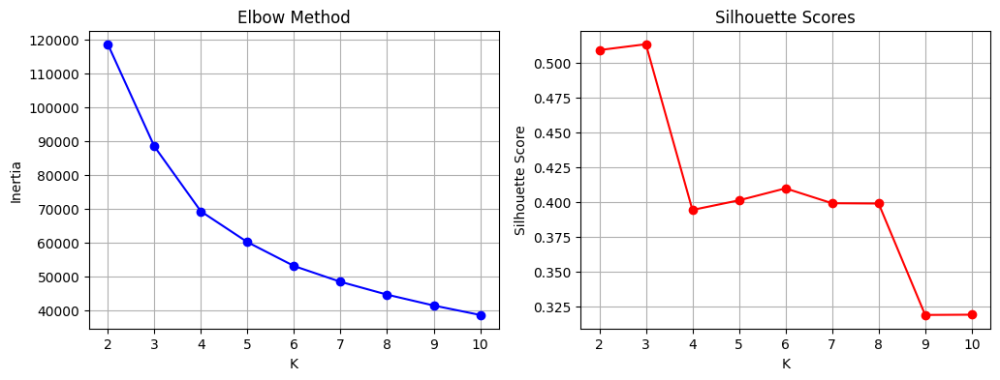

In [ ]:
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import numpy as np

max_k = 10
inertias = []
sil_scores = []

sample_size = min(10000, features.shape[0])
subset_idx = np.random.choice(features.shape[0], sample_size, replace=False)
features_subset = features[subset_idx]

for k in range(2, max_k+1):
    km = KMeans(n_clusters=k, n_init=10, random_state=42)
    km.fit(features)
    inertias.append(km.inertia_)
    
    labels_sub = km.predict(features_subset)
    score = silhouette_score(features_subset, labels_sub)
    sil_scores.append(score)

plt.figure(figsize=(12,4))
plt.subplot(1,2,1)
plt.plot(range(2, max_k+1), inertias, 'bo-')
plt.xlabel('K'); plt.ylabel('Inertia'); plt.title('Elbow Method')
plt.grid(True)

plt.subplot(1,2,2)
plt.plot(range(2, max_k+1), sil_scores, 'ro-')
plt.xlabel('K'); plt.ylabel('Silhouette Score'); plt.title('Silhouette Scores')
plt.grid(True)

plt.show()


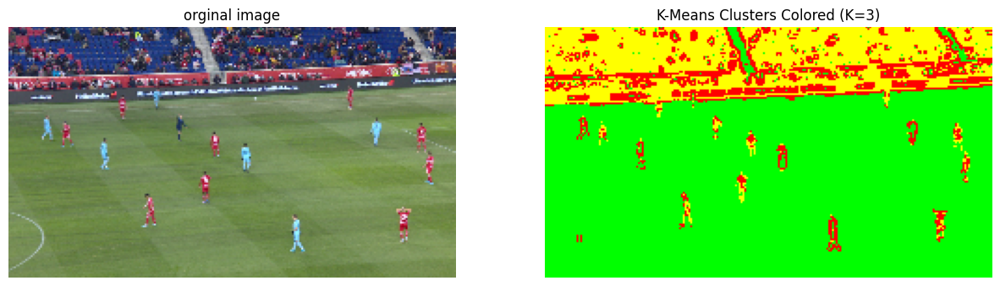

In [58]:
def run_kmeans_colored(image, features, k):
    h, w, _ = image.shape
    kmeans = KMeans(n_clusters=k, n_init=10, random_state=42)
    kmeans.fit(features)
    labels = kmeans.labels_
    labels_img = labels.reshape(h, w)
    
    color_map = {
        0: [255, 0, 0],    # red
        1: [0, 255, 0],    # green
        2: [255, 255, 0],  # yellow
        3: [0, 0, 255],    # blue
        4: [150, 150, 150] # gray
    }
    
    colored_result = np.zeros((h, w, 3), dtype=np.uint8)
    for cluster_idx, color in color_map.items():
        colored_result[labels_img == cluster_idx] = color
    
    plt.figure(figsize=(15,7))
    plt.subplot(1,2,1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title("orginal image")
    plt.axis("off")
    
    plt.subplot(1,2,2)
    plt.imshow(colored_result)
    plt.title(f"K-Means Clusters Colored (K={k})")
    plt.axis("off")
    plt.show()
    
    return labels_img, colored_result

OPTIMAL_K = 3

labels_img, colored_result = run_kmeans_colored(sample_img_bgr, features, OPTIMAL_K)

### K-Means Clustering

1. **Purpose**: خوشه‌بندی پیکسل‌ها بر اساس ویژگی‌های استخراج شده.
2. **Optimal K**: تعیین تعداد خوشه‌ها با دو معیار:
   - **Elbow Method**: بررسی Inertia (جمع مربعات فاصله‌ها از مرکز خوشه).
   - **Silhouette Score**: ارزیابی کیفیت خوشه‌ها (نزدیکی به خوشه خودی و دوری از خوشه‌های دیگر).
3. **Clustering**: اجرای K-Means روی ویژگی‌ها با تعداد خوشه‌ی بهینه `K=3`.
4. **Visualization**: نمایش تصویر اصلی و تصویر رنگی‌شده که هر خوشه با یک رنگ متفاوت نشان داده شده.


### DBSCAN

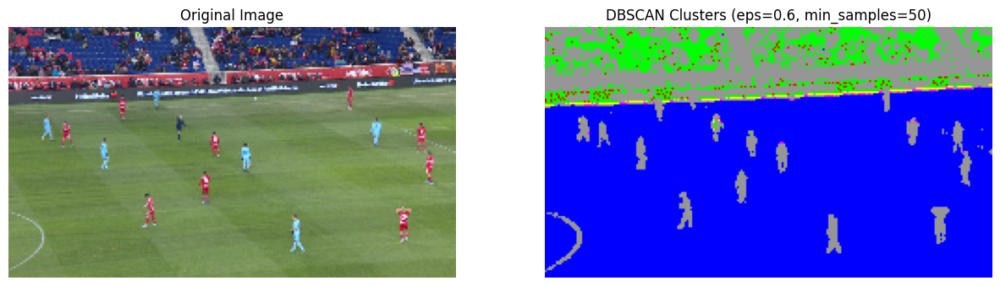

Silhouette Score (excluding noise): 0.453


In [ ]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import numpy as np
import cv2

def run_dbscan_colored(image, features, eps=0.5, min_samples=50):
    """
    Run DBSCAN clustering on extracted features and visualize the segmentation.
    
    Parameters:
        image (ndarray): Original input image (BGR).
        features (ndarray): Feature vectors for all pixels.
        eps (float): Neighborhood radius.
        min_samples (int): Minimum points required to form a dense cluster.
    
    Returns:
        labels_img (ndarray): Cluster labels reshaped into image form.
        colored_result (ndarray): Segmentation result with colored clusters.
    """
    h, w, _ = image.shape
    
    db = DBSCAN(eps=eps, min_samples=min_samples, n_jobs=-1)
    labels = db.fit_predict(features)
    labels_img = labels.reshape(h, w)
    
    unique_labels = np.unique(labels)
    
    color_map = {
        -1: [150, 150, 150], # Noise (gray)
         0: [0, 255, 0],     # Cluster 0 = Grass (green)
         1: [255, 0, 0],     # Cluster 1 = Player (red)
         2: [255, 255, 0],   # Cluster 2 = Player2 (yellow)
         3: [0, 0, 255],     # Cluster 3 = Others (blue)
    }
    
    colored_result = np.zeros((h, w, 3), dtype=np.uint8)
    for lbl in unique_labels:
        color = color_map.get(lbl, [255, 0, 255])
        colored_result[labels_img == lbl] = color
    
    plt.figure(figsize=(15,7))
    plt.subplot(1,2,1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title("Original Image")
    plt.axis("off")
    
    plt.subplot(1,2,2)
    plt.imshow(colored_result)
    plt.title(f"DBSCAN Clusters (eps={eps}, min_samples={min_samples})")
    plt.axis("off")
    plt.show()
    
    valid_mask = labels != -1
    if len(np.unique(labels[valid_mask])) > 1:
        sil_score = silhouette_score(features[valid_mask], labels[valid_mask])
    else:
        sil_score = -1
    
    print(f"Silhouette Score (excluding noise): {sil_score:.3f}")
    
    return labels_img, colored_result, sil_score

feature_weights = {'spatial':0.3, 'edge':1.5, 'texture':1.0}
sample_img_bgr = resized_images_dict[sample_key]
features = create_hybrid_features_colored(sample_img_bgr, feature_weights)

labels_img, colored_result, sil_score = run_dbscan_colored(
    sample_img_bgr, 
    features, 
    eps=0.6, 
    min_samples=50
)


### DBSCAN Clustering

1. **Purpose**: خوشه‌بندی پیکسل‌ها بدون نیاز به تعیین تعداد خوشه از قبل.
2. **Parameters**:
   - `eps=0.6`: شعاع همسایگی برای تراکم.
   - `min_samples=50`: حداقل تعداد پیکسل برای تشکیل خوشه.
3. **Noise Handling**: پیکسل‌های نویزی (`-1`) به رنگ خاکستری نمایش داده می‌شوند.
4. **Visualization**: نمایش تصویر اصلی و تصویر خوشه‌بندی‌شده با رنگ‌های مختلف برای هر خوشه.
5. **Evaluation**: محاسبه Silhouette Score فقط روی پیکسل‌های معتبر (غیر نویز) برای سنجش کیفیت خوشه‌ها.


### Agglomerative clustring

k=2, silhouette=0.5028
k=3, silhouette=0.4909
k=4, silhouette=0.3422
k=5, silhouette=0.3531
k=6, silhouette=0.3629


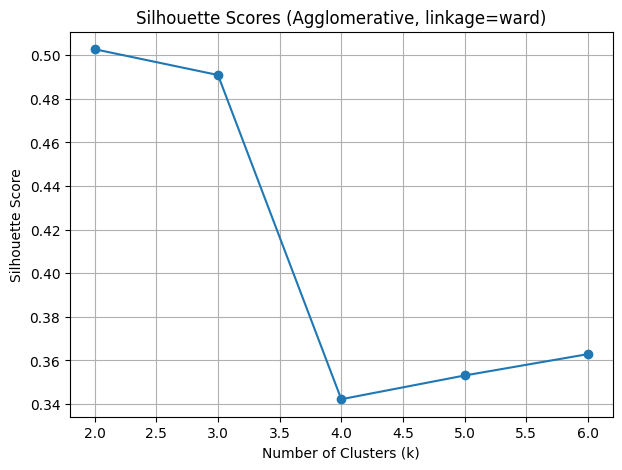

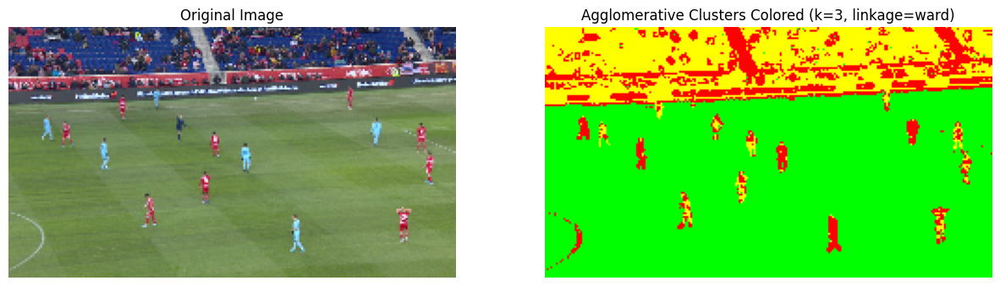

In [ ]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import numpy as np
import cv2

def run_agglomerative_colored(image, features, n_clusters=3, linkage='ward'):
    """
    Agglomerative Clustering for image segmentation.

    n_clusters: number of clusters
    linkage: linkage criterion ('ward', 'complete', 'average', 'single')
    """
    h, w, _ = image.shape
    
    agg = AgglomerativeClustering(n_clusters=n_clusters, linkage=linkage)
    labels = agg.fit_predict(features)
    
    labels_img = labels.reshape(h, w)
    
    color_map = {
        # 0: [0, 255, 0],    # green
        # 1: [255, 0, 0],    # red
        # 2: [255, 255, 0],  # yellow
        # 3: [0, 0, 255],    # blue
        # 4: [150, 150, 150] # gray

        0: [0, 255, 0],    # green
        1: [255, 0, 0],    # red
        2: [255, 255, 0],  # yellow
        3: [0, 0, 255],    # blue
        4: [150, 150, 150] # gray
    }
    
    colored_result = np.zeros((h, w, 3), dtype=np.uint8)
    for cluster_idx, color in color_map.items():
        colored_result[labels_img == cluster_idx] = color
    
    plt.figure(figsize=(15,7))
    plt.subplot(1,2,1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title("Original Image")
    plt.axis("off")
    
    plt.subplot(1,2,2)
    plt.imshow(colored_result)
    plt.title(f"Agglomerative Clusters Colored (k={n_clusters}, linkage={linkage})")
    plt.axis("off")
    
    plt.show()
    
    return labels_img, colored_result


def plot_silhouette_scores(features, k_range, linkage='ward', sample_size=5000):
    """
    Faster silhouette score calculation using pixel sampling.
    """
    if features.shape[0] > sample_size:
        idx = np.random.choice(features.shape[0], sample_size, replace=False)
        sample_features = features[idx]
    else:
        sample_features = features
    
    scores = []
    for k in k_range:
        agg = AgglomerativeClustering(n_clusters=k, linkage=linkage)
        labels = agg.fit_predict(sample_features)
        if len(np.unique(labels)) > 1:
            score = silhouette_score(sample_features, labels)
        else:
            score = -1
        scores.append(score)
        print(f"k={k}, silhouette={score:.4f}")
    
    plt.figure(figsize=(7,5))
    plt.plot(k_range, scores, marker='o')
    plt.xlabel("Number of Clusters (k)")
    plt.ylabel("Silhouette Score")
    plt.title(f"Silhouette Scores (Agglomerative, linkage={linkage})")
    plt.grid(True)
    plt.show()
feature_weights = {'spatial':0.3, 'edge':1.5, 'texture':1.0}
sample_img_bgr = resized_images_dict[sample_key]
features = create_hybrid_features_colored(sample_img_bgr, feature_weights)

plot_silhouette_scores(features, k_range=range(2,7), linkage='ward')

labels_img, colored_result = run_agglomerative_colored(sample_img_bgr, features, n_clusters=3, linkage='ward')


### Agglomerative (Hierarchical) Clustering

1. **Purpose**: خوشه‌بندی سلسله‌مراتبی پیکسل‌ها بدون نیاز به نویز هندلینگ.
2. **Parameters**:
   - `n_clusters=3`: تعداد خوشه‌ها
   - `linkage='ward'`: معیار ترکیب خوشه‌ها (Ward’s method)
3. **Coloring**: هر خوشه با یک رنگ مشخص نمایش داده می‌شود.
4. **Silhouette Score**: برای سنجش کیفیت خوشه‌بندی، محاسبه شده و برای تعیین بهترین `k` استفاده می‌شود.
5. **Visualization**: تصویر اصلی و تصویر خوشه‌بندی‌شده به صورت کنار هم نمایش داده می‌شوند.


## Filtering and Merging

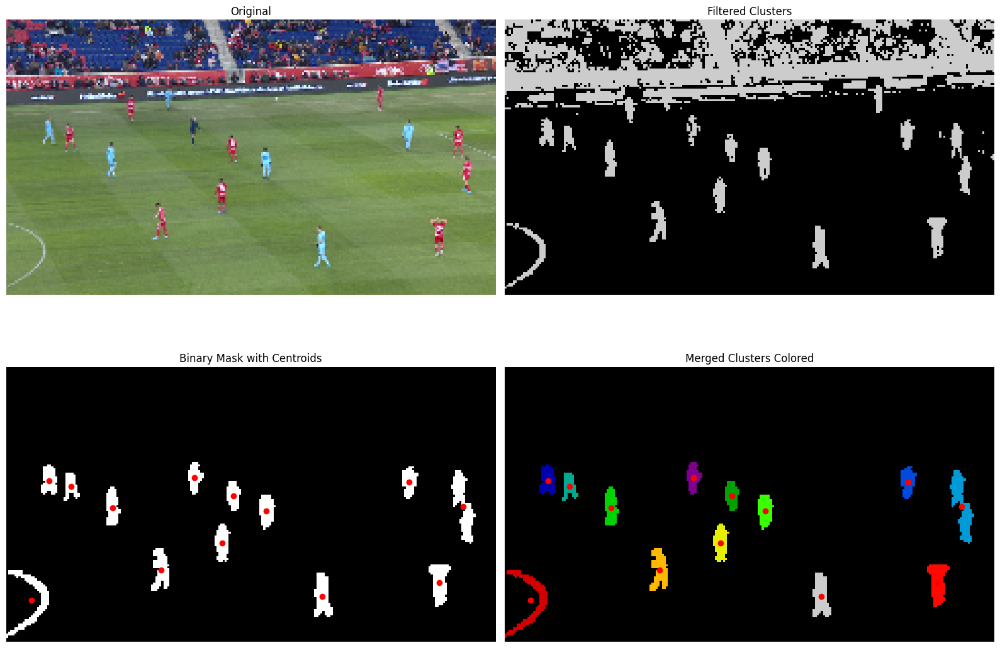

In [ ]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import numpy as np
import cv2

def run_dbscan_colored(image, features, eps=0.5, min_samples=50):
    h, w, _ = image.shape
    
    db = DBSCAN(eps=eps, min_samples=min_samples, n_jobs=-1)
    labels = db.fit_predict(features)
    labels_img = labels.reshape(h, w)
    
    return labels, labels_img

def find_cluster_sizes(labels_flatten):
    replaced_value = max(labels_flatten) + 1
    labels_flatten = [replaced_value if i == -1 else i for i in labels_flatten]
    cluster_sizes = np.bincount(labels_flatten)
    return cluster_sizes, labels_flatten

def filter_cluster(cluster_sizes, minthresh=500, maxthresh=5000):
    valid_clusters = []
    for i, cluster_size in enumerate(cluster_sizes):
        if minthresh < cluster_size < maxthresh:
            valid_clusters.append(i)
    return valid_clusters

def merge_close_clusters(label_img, min_area=30, dilation_iter=1):
    new_img = np.zeros_like(label_img)
    binary_mask = np.zeros_like(label_img)
    centroids_list = []
    current_label = 1
    unique_labels = np.unique(label_img)

    for lbl in unique_labels:
        if lbl == 0:
            continue
        mask = (label_img == lbl).astype(np.uint8)
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2, 2))
        dilated = cv2.dilate(mask, kernel, iterations=dilation_iter)

        num_labels, conn_labels, stats, centroids = cv2.connectedComponentsWithStats(dilated)
        for i in range(1, num_labels):
            width = stats[i, cv2.CC_STAT_WIDTH]
            height = stats[i, cv2.CC_STAT_HEIGHT]
            h_w_ratio = height / (width + 1e-5)
            area = stats[i, cv2.CC_STAT_AREA]
            if 1 < h_w_ratio < 5 and area >= min_area:
                new_img[conn_labels == i] = current_label
                binary_mask[conn_labels == i] = 1
                centroids_list.append(centroids[i])
                current_label += 1

    return new_img, binary_mask, np.array(centroids_list)

def pipeline_player_segmentation_colored_2x2(image, features, eps=0.6, min_samples=50):
    h, w, _ = image.shape
    labels, labels_img = run_dbscan_colored(image, features, eps, min_samples)
    
    cluster_sizes, labels_flatten = find_cluster_sizes(labels.flatten())
    valid_clusters = filter_cluster(cluster_sizes, minthresh=500, maxthresh=8000)
    filtered_labels_flatten = np.array([i if i in valid_clusters else 0 for i in labels_flatten])
    filtered_labels_img = filtered_labels_flatten.reshape(h, w)
    
    merged, binary_mask, centroids = merge_close_clusters(filtered_labels_img)
    
    fig, axes = plt.subplots(2, 2, figsize=(16,12))
    
    axes[0,0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[0,0].set_title("Original")
    axes[0,0].axis("off")
    
    axes[0,1].imshow(filtered_labels_img, cmap="nipy_spectral")
    axes[0,1].set_title("Filtered Clusters")
    axes[0,1].axis("off")
    
    axes[1,0].imshow(binary_mask, cmap="gray")
    for (x, y) in centroids:
        axes[1,0].plot(x, y, 'ro', markersize=6)
    axes[1,0].set_title("Binary Mask with Centroids")
    axes[1,0].axis("off")
    
    axes[1,1].imshow(merged, cmap="nipy_spectral")
    for (x, y) in centroids:
        axes[1,1].plot(x, y, 'ro', markersize=6)
    axes[1,1].set_title("Merged Clusters Colored")
    axes[1,1].axis("off")
    
    plt.tight_layout()
    plt.show()
    
    return merged, binary_mask, centroids

merged, binary_mask, centroids = pipeline_player_segmentation_colored_2x2(
    sample_img_bgr, 
    features, 
    eps=0.6, 
    min_samples=50
)


## More Advanced Features!

In [ ]:
import torch
import torchvision.transforms as T
from torchvision.models import resnet50, ResNet50_Weights
from torch import nn
import numpy as np
import matplotlib.pyplot as plt
import cv2
from sklearn.cluster import DBSCAN

resnet = resnet50(weights=ResNet50_Weights.DEFAULT)
resnet_features = nn.Sequential(*list(resnet.children())[:-2])
resnet.eval()

c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to C:\Users\User/.cache\torch\hub\checkpoints\resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:46<00:00, 2.22MB/s]


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [ ]:
import torch
import torch.nn.functional as F
import timm
import numpy as np
from PIL import Image
import cv2

def get_hrnet_model():
    model = timm.create_model('hrnet_w18', pretrained=True, features_only=True)
    model.eval()
    return model

hrnet_model = get_hrnet_model()

model.safetensors:   0%|          | 0.00/85.6M [00:00<?, ?B/s]

Unexpected keys (downsamp_modules.0.0.bias, downsamp_modules.0.0.weight, downsamp_modules.0.1.bias, downsamp_modules.0.1.num_batches_tracked, downsamp_modules.0.1.running_mean, downsamp_modules.0.1.running_var, downsamp_modules.0.1.weight, downsamp_modules.1.0.bias, downsamp_modules.1.0.weight, downsamp_modules.1.1.bias, downsamp_modules.1.1.num_batches_tracked, downsamp_modules.1.1.running_mean, downsamp_modules.1.1.running_var, downsamp_modules.1.1.weight, downsamp_modules.2.0.bias, downsamp_modules.2.0.weight, downsamp_modules.2.1.bias, downsamp_modules.2.1.num_batches_tracked, downsamp_modules.2.1.running_mean, downsamp_modules.2.1.running_var, downsamp_modules.2.1.weight, final_layer.0.bias, final_layer.0.weight, final_layer.1.bias, final_layer.1.num_batches_tracked, final_layer.1.running_mean, final_layer.1.running_var, final_layer.1.weight, classifier.bias, classifier.weight) found while loading pretrained weights. This may be expected if model is being adapted.


In [ ]:
def hrnet_transform(image_bgr):
    img_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
    img_pil = Image.fromarray(img_rgb)
    
    h, w = img_pil.size
    h_new = ((h // 32) + 1) * 32
    w_new = ((w // 32) + 1) * 32
    img_resized = img_pil.resize((w_new, h_new))
    
    img_tensor = torch.tensor(np.array(img_resized)/255., dtype=torch.float32).permute(2,0,1).unsqueeze(0)
    
    mean = torch.tensor([0.485, 0.456, 0.406]).view(1,3,1,1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(1,3,1,1)
    
    img_tensor = (img_tensor - mean)/std
    return img_tensor, (image_bgr.shape[0], image_bgr.shape[1])

def extract_hrnet_features(image_bgr):
    img_tensor, orig_size = hrnet_transform(image_bgr)
    
    with torch.no_grad():
        features = hrnet_model(img_tensor)[0] 
    
    feat_up = F.interpolate(features, size=orig_size, mode='bilinear', align_corners=False)
    feat_map = feat_up.squeeze(0).permute(1,2,0).cpu().numpy()
    
    return feat_map

sample_img_bgr = resized_images_dict[sample_key] 
feature_map = extract_hrnet_features(sample_img_bgr)
print("Feature map shape:", feature_map.shape)


Feature map shape: (135, 240, 64)


Shape after PCA: (32400, 13)


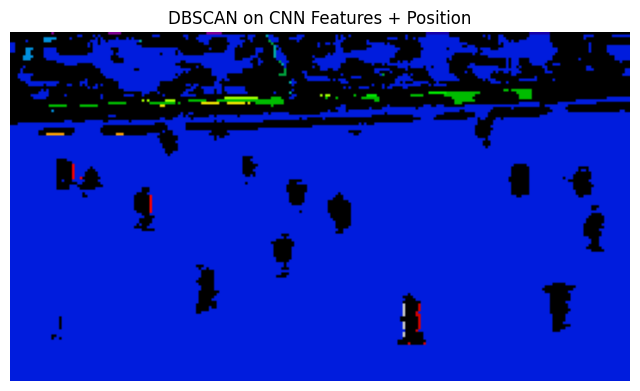

Number of -1 labels (potential players): 6882


In [ ]:
import torch
import torch.nn.functional as F
import numpy as np
from sklearn.cluster import DBSCAN
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

def add_position_to_features(feat_map):
    """
    feat_map: [H, W, C]
    Returns: [H, W, C+2] with normalized x, y positions
    """
    H, W, C = feat_map.shape
    x_coords = np.linspace(0, 1, W)
    y_coords = np.linspace(0, 1, H)
    xx, yy = np.meshgrid(x_coords, y_coords)
    xx = xx[..., np.newaxis]
    yy = yy[..., np.newaxis]
    feat_with_pos = np.concatenate([feat_map, xx, yy], axis=-1)
    return feat_with_pos

feat_with_pos = add_position_to_features(feature_map)

H, W, C_plus2 = feat_with_pos.shape
features_flat = feat_with_pos.reshape(-1, C_plus2)

pca = PCA(n_components=0.95)
features_flat_reduced = pca.fit_transform(features_flat)
print("Shape after PCA:", features_flat_reduced.shape)

db = DBSCAN(eps=0.3, min_samples=10, n_jobs=-1)
labels_flat = db.fit_predict(features_flat_reduced)

labels_map = labels_flat.reshape(H, W)

plt.figure(figsize=(8,6))
plt.imshow(labels_map, cmap="nipy_spectral")
plt.title("DBSCAN on CNN Features + Position")
plt.axis("off")
plt.show()
num_outliers = (labels_flat == -1).sum()
print("Number of -1 labels (potential players):", num_outliers)


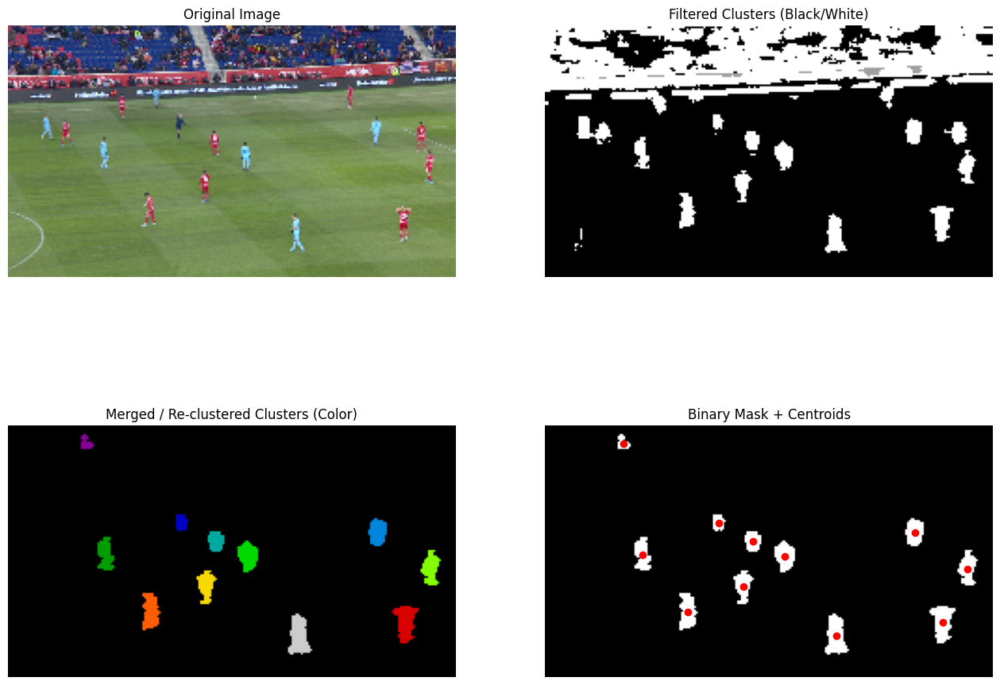

In [ ]:
def find_cluster_sizes(labels_flatten):
    replaced_value = max(labels_flatten) + 1
    labels_flatten_fixed = np.array([replaced_value if l == -1 else l for l in labels_flatten])
    cluster_sizes = np.bincount(labels_flatten_fixed)
    return cluster_sizes, labels_flatten_fixed

def filter_clusters(cluster_sizes, labels_flatten, min_thresh=50, max_thresh=10000):
    valid_clusters = [i for i, size in enumerate(cluster_sizes) if min_thresh < size < max_thresh]
    filtered = np.array([l if l in valid_clusters else 0 for l in labels_flatten])
    return filtered

def merge_close_clusters(label_img, min_area=30, dilation_iter=1):
    new_img = np.zeros_like(label_img)
    binary_mask = np.zeros_like(label_img)
    centroids_list = []
    current_label = 1
    unique_labels = np.unique(label_img)

    for lbl in unique_labels:
        if lbl == 0:
            continue
        mask = (label_img == lbl).astype(np.uint8)
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2, 2))
        dilated = cv2.dilate(mask, kernel, iterations=dilation_iter)

        num_labels, conn_labels, stats, centroids = cv2.connectedComponentsWithStats(dilated)
        for i in range(1, num_labels):
            width = stats[i, cv2.CC_STAT_WIDTH]
            height = stats[i, cv2.CC_STAT_HEIGHT]
            h_w_ratio = height / (width + 1e-5)
            area = stats[i, cv2.CC_STAT_AREA]
            if 1 < h_w_ratio < 5 and area >= min_area:
                new_img[conn_labels == i] = current_label
                binary_mask[conn_labels == i] = 1
                centroids_list.append(centroids[i])
                current_label += 1

    return new_img, binary_mask, np.array(centroids_list)
merged, binary_mask, centroids, filtered_labels_img, raw_labels_img = None, None, None, None, None

def hrnet_pipeline_with_all_outputs(image_bgr, eps=0.3, min_samples=10):
    feature_map = extract_hrnet_features(image_bgr)
    feat_with_pos = add_position_to_features(feature_map)
    H, W, C_plus2 = feat_with_pos.shape
    features_flat = feat_with_pos.reshape(-1, C_plus2)

    db = DBSCAN(eps=eps, min_samples=min_samples, n_jobs=-1)
    labels_flat = db.fit_predict(features_flat)

    raw_labels_img = labels_flat.reshape(H, W)

    cluster_sizes, labels_fixed = find_cluster_sizes(labels_flat)
    filtered_labels_flat = filter_clusters(cluster_sizes, labels_fixed)
    filtered_labels_img = filtered_labels_flat.reshape(H, W)

    merged, binary_mask, centroids = merge_close_clusters(filtered_labels_img)

    return raw_labels_img, filtered_labels_img, merged, binary_mask, centroids
raw_labels_img, filtered_labels_img, merged_labels_img, binary_mask, centroids = hrnet_pipeline_with_all_outputs(sample_img_bgr)

plt.figure(figsize=(16,12))

plt.subplot(2,2,1)
plt.imshow(cv2.cvtColor(sample_img_bgr, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title("Original Image")

plt.subplot(2,2,2)
plt.imshow(filtered_labels_img, cmap='gray')
plt.axis('off')
plt.title("Filtered Clusters (Black/White)")

plt.subplot(2,2,3)
plt.imshow(merged_labels_img, cmap='nipy_spectral')
plt.axis('off')
plt.title("Merged / Re-clustered Clusters (Color)")

plt.subplot(2,2,4)
plt.imshow(binary_mask, cmap='gray')
for (x, y) in centroids:
    plt.plot(x, y, 'ro', markersize=6)
plt.axis('off')
plt.title("Binary Mask + Centroids")

plt.show()


## Player Segmentation Pipeline

### 1️⃣ Feature-based DBSCAN (Hand-crafted Features)
- **Features**: 
  - LAB color channels  
  - Pixel coordinates `(x, y)`  
  - Edge magnitude (Sobel)  
  - Texture (Local Binary Pattern)
- **Pipeline Steps**:
  1. Flatten features and normalize.
  2. Apply **DBSCAN** for pixel clustering.
  3. **Filter clusters** by size to remove very small/large clusters (likely noise).
  4. **Merge nearby clusters** to unify fragmented player regions.
  5. Generate **binary mask** and **centroids** for each player.

- **Pros**:
  - Simple and fast.
  - Fully interpretable features.
- **Cons**:
  - Sensitive to illumination and texture variations.
  - May fail on complex or crowded scenes.

---

### 2️⃣ HRNet + DBSCAN (Deep Features)
- **Features**:
  - High-level deep features extracted from **HRNet** pretrained model.
  - Added normalized pixel positions `(x, y)`.
- **Pipeline Steps**:
  1. Extract HRNet feature map.
  2. Add normalized pixel coordinates to features.
  3. Flatten and optionally reduce dimensionality (e.g., PCA).
  4. Apply **DBSCAN** for clustering.
  5. **Filter clusters** by size.
  6. **Merge nearby clusters**.
  7. Obtain **binary mask** and **centroids**.

- **Pros**:
  - More robust to variations in appearance, pose, and background.
  - Captures semantic information beyond color/texture.
- **Cons**:
  - Computationally heavier.
  - Requires pretrained deep model.

---

### 3️⃣ Comparison
| Aspect                  | Hand-crafted Features | HRNet Deep Features |
|-------------------------|--------------------|------------------|
| Feature Type            | Color, edge, texture, position | Semantic deep features + position |
| Robustness              | Low to medium       | High |
| Computational Cost      | Low                 | High |
| Sensitivity to Noise    | High                | Medium |
| Performance in Crowded Scenes | Moderate       | Better |
| Interpretability        | High                | Medium |

**Conclusion**:  
- **Hand-crafted features**: Quick, interpretable, but less robust.  
- **HRNet deep features**: More accurate for challenging images, better separation of players, handles variations in appearance and background, at the cost of higher computation.


## Evaluation

In [ ]:
import numpy as np
import cv2
import random
from tqdm import tqdm

def dice_coefficient(y_true, y_pred):
    intersection = np.logical_and(y_true, y_pred).sum()
    return (2. * intersection) / (y_true.sum() + y_pred.sum() + 1e-8)

def iou_score(y_true, y_pred):
    intersection = np.logical_and(y_true, y_pred).sum()
    union = np.logical_or(y_true, y_pred).sum()
    return intersection / (union + 1e-8)

def evaluate_segmentation(resized_images_dict, coco, n_samples=50):
    filenames = list(resized_images_dict.keys())
    sample_filenames = random.sample(filenames, n_samples)

    dice_scores = []
    iou_scores = []

    for filename in tqdm(sample_filenames, desc="Evaluating"):
        img_bgr = resized_images_dict[filename]
        _, _, _, pred_mask, _ = hrnet_pipeline_with_all_outputs(img_bgr)
        gt_mask = get_mask_for_image(filename, coco)
        if gt_mask is None:
            continue
        gt_mask_resized = cv2.resize(gt_mask, (img_bgr.shape[1], img_bgr.shape[0]),
                                     interpolation=cv2.INTER_NEAREST)
        pred_bin = pred_mask.astype(bool)
        gt_bin = gt_mask_resized.astype(bool)
        dice = dice_coefficient(gt_bin, pred_bin)
        iou = iou_score(gt_bin, pred_bin)
        dice_scores.append(dice)
        iou_scores.append(iou)
    mean_dice = np.mean(dice_scores) if dice_scores else 0
    mean_iou = np.mean(iou_scores) if iou_scores else 0
    print(f"Evaluation on {len(dice_scores)} images:")
    print(f"Average Dice Coefficient: {mean_dice:.4f}")
    print(f"Average IoU: {mean_iou:.4f}")
    return dice_scores, iou_scores
dice_scores, iou_scores = evaluate_segmentation(resized_images_dict, coco, n_samples=50)


Evaluating: 100%|██████████| 50/50 [11:05<00:00, 13.31s/it]

Evaluation on 50 images:
Average Dice Coefficient: 0.4131
Average IoU: 0.2741


HRNet + DBSCAN Binary Masks - Dice: 0.4131, IoU: 0.2741


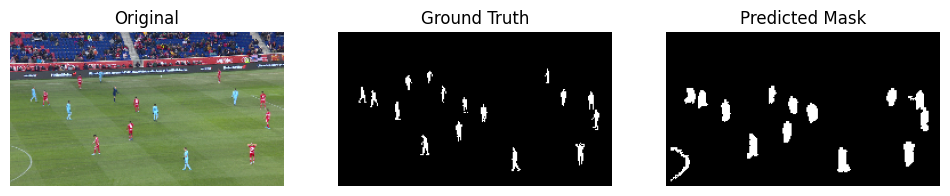

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
def compute_dice_and_iou(pred_mask, gt_mask):
    pred_mask = pred_mask.astype(bool)
    gt_mask = gt_mask.astype(bool)
    
    intersection = np.logical_and(pred_mask, gt_mask).sum()
    union = np.logical_or(pred_mask, gt_mask).sum()
    
    dice = (2 * intersection) / (pred_mask.sum() + gt_mask.sum() + 1e-8)
    iou = intersection / (union + 1e-8)
    return dice, iou
def evaluate_segmentation(pred_masks, gt_masks):
    dice_scores, iou_scores = [], []
    for pred, gt in zip(pred_masks, gt_masks):
        dice, iou = compute_dice_and_iou(pred, gt)
        dice_scores.append(dice)
        iou_scores.append(iou)
    return np.mean(dice_scores), np.mean(iou_scores)

binary_masks = []
for filename, img in resized_images_dict.items():
    _, _, _, binary_mask, _ = hrnet_pipeline_with_all_outputs(img)
    binary_masks.append(binary_mask)

gt_masks = []
for filename, img in resized_images_dict.items():
    mask = get_mask_for_image(filename, coco)
    if mask is not None:
        mask_resized = cv2.resize(
            mask,
            (img.shape[1], img.shape[0]),
            interpolation=cv2.INTER_NEAREST
        )
        gt_masks.append(mask_resized)
    else:
        gt_masks.append(np.zeros(img.shape[:2], dtype=np.uint8))

dice_score, iou_score = evaluate_segmentation(binary_masks, gt_masks)
print(f"HRNet + DBSCAN Binary Masks - Dice: {dice_score:.4f}, IoU: {iou_score:.4f}")
idx = 0
sample_img = list(resized_images_dict.values())[idx]
plt.figure(figsize=(12,4))
plt.subplot(1,3,1); plt.imshow(cv2.cvtColor(sample_img, cv2.COLOR_BGR2RGB)); plt.title("Original"); plt.axis("off")
plt.subplot(1,3,2); plt.imshow(gt_masks[idx], cmap='gray'); plt.title("Ground Truth"); plt.axis("off")
plt.subplot(1,3,3); plt.imshow(binary_masks[idx], cmap='gray'); plt.title("Predicted Mask"); plt.axis("off")
plt.show()


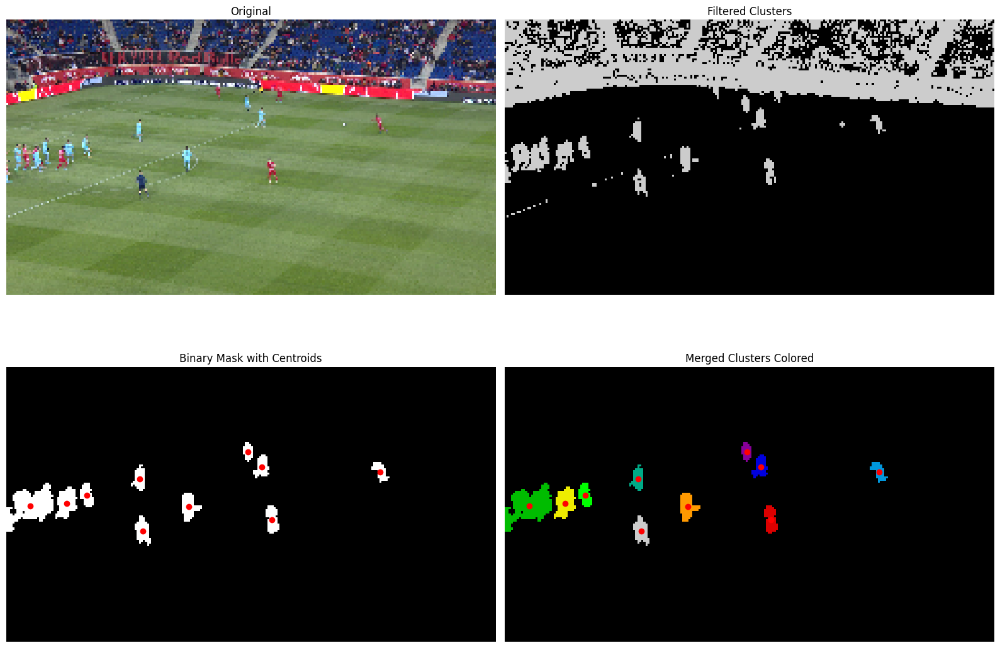

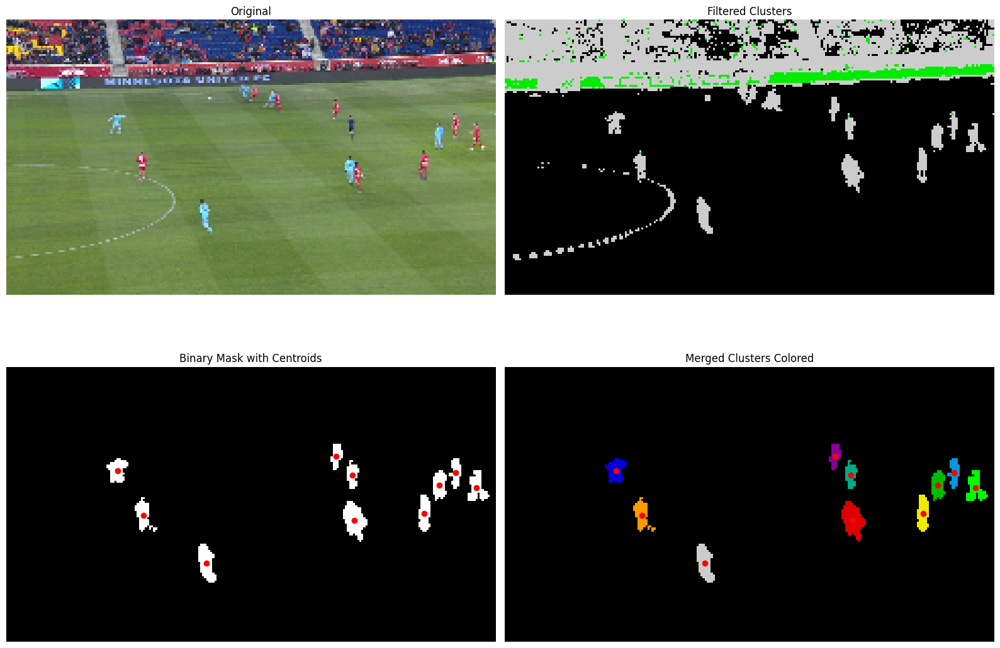

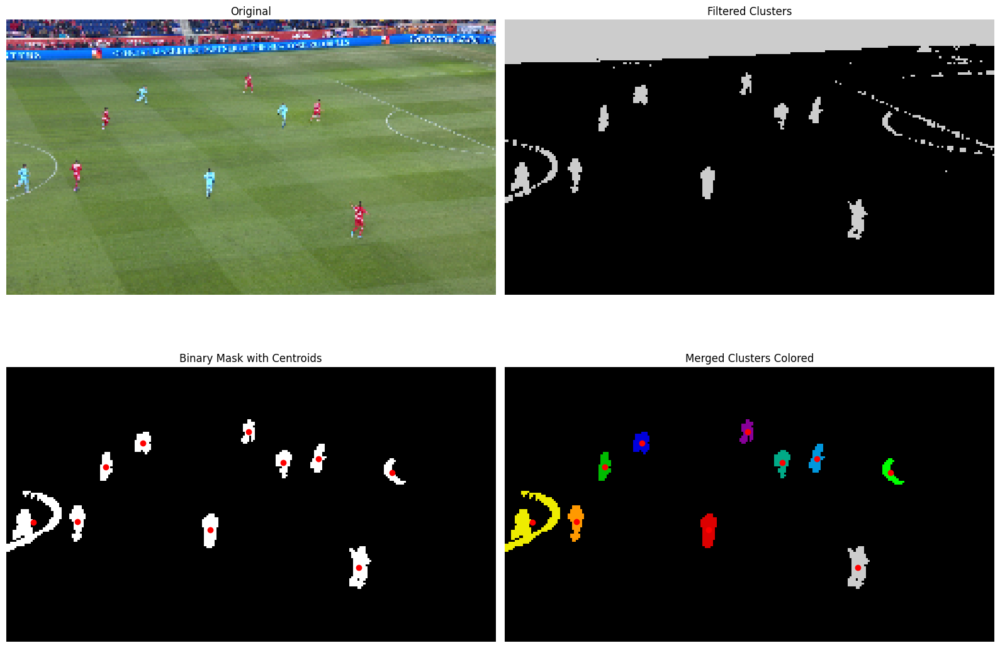

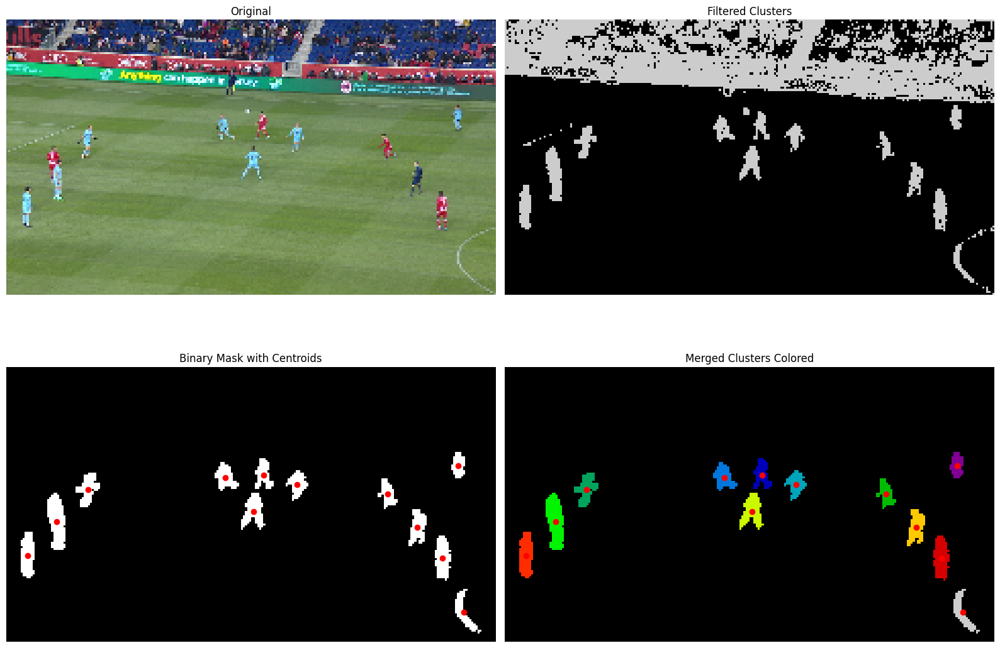

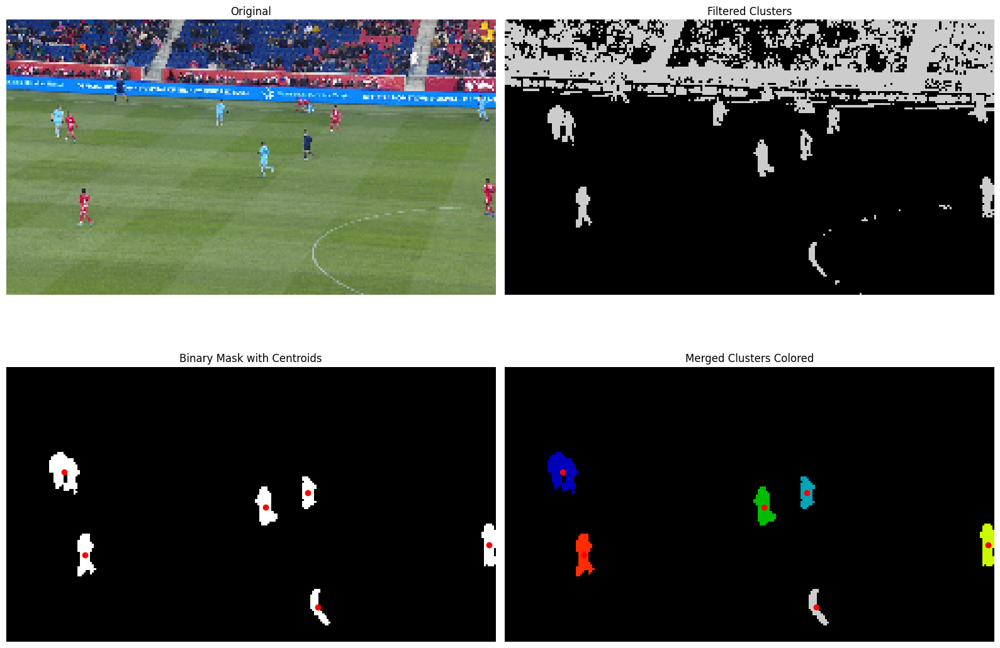

...

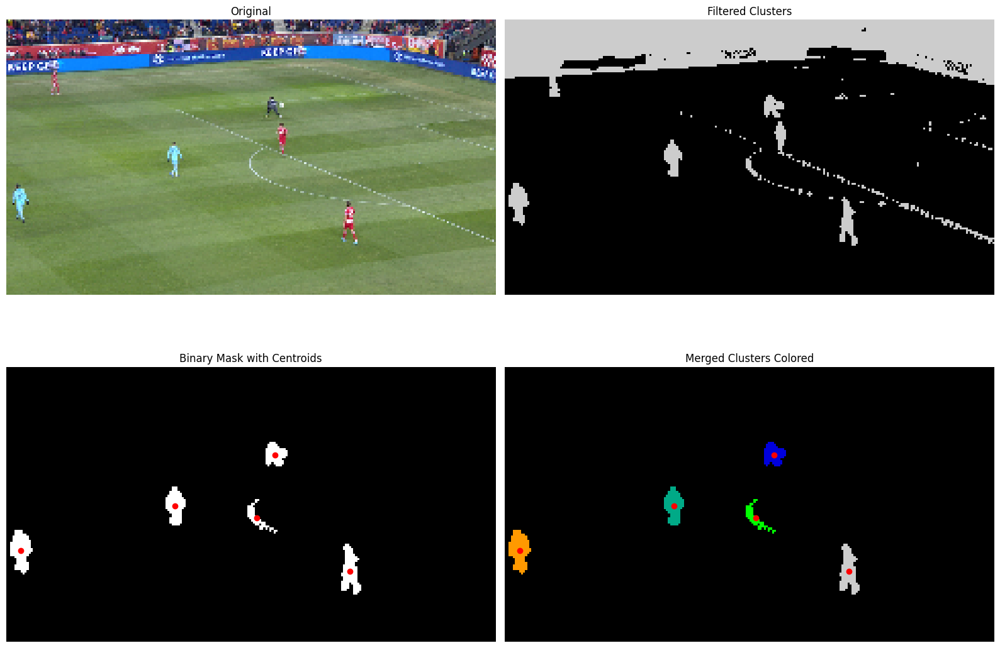

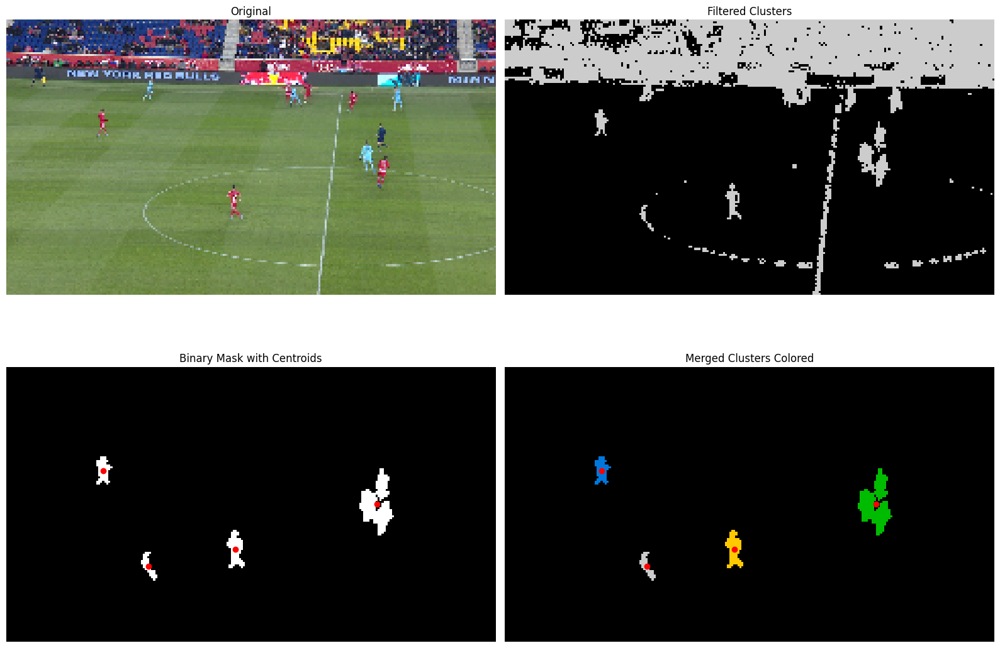

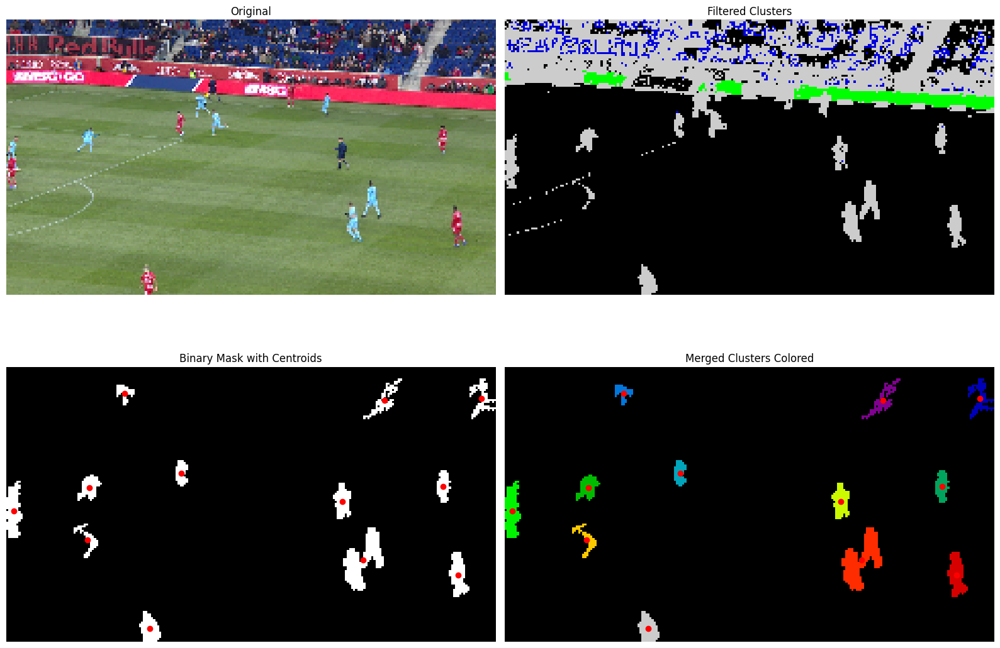

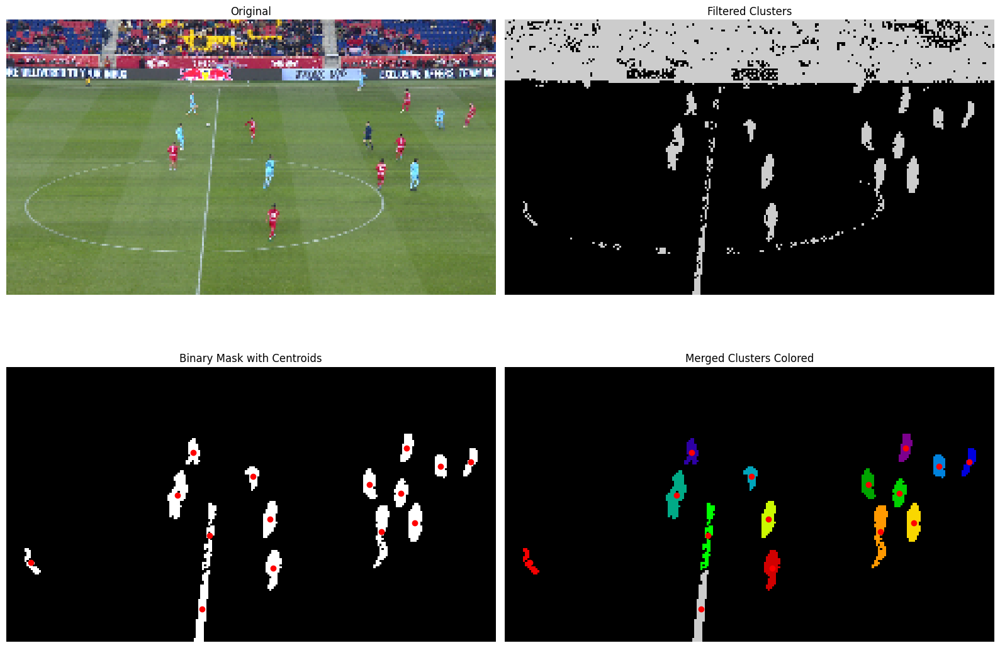

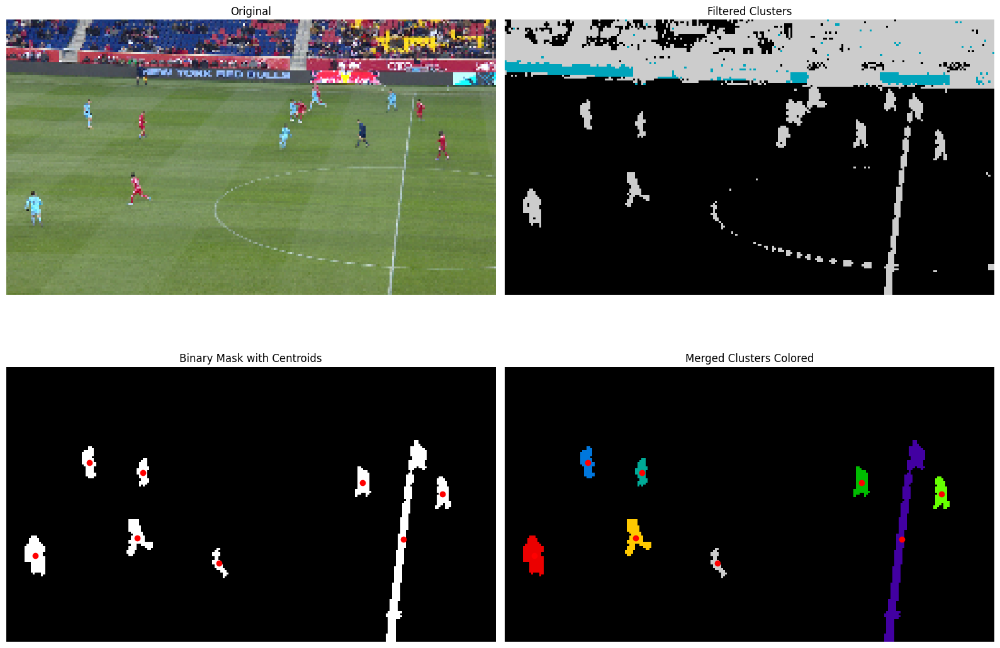

===== Manual Features =====
Average Dice: 0.4892, Average IoU: 0.3384
===== CNN (HRNet) Features =====
Average Dice: 0.4131, Average IoU: 0.2741


In [104]:
import random
import numpy as np
import cv2

def evaluate_segmentation_metrics(resized_images_dict, coco, n_samples=50):
    filenames = list(resized_images_dict.keys())
    sample_filenames = random.sample(filenames, n_samples)

    dice_manual_list, iou_manual_list = [], []
    dice_cnn_list, iou_cnn_list = [], []

    for fname in sample_filenames:
        img = resized_images_dict[fname]

        feature_weights = {'spatial':0.3, 'edge':1.5, 'texture':1.0}
        features = create_hybrid_features_colored(img, feature_weights)
        _, binary_mask_manual, _ = pipeline_player_segmentation_colored_2x2(img, features)
        pred_manual = binary_mask_manual.astype(bool)

        _, _, _, binary_mask_cnn, _ = hrnet_pipeline_with_all_outputs(img)
        pred_cnn = binary_mask_cnn.astype(bool)

        gt_mask = get_mask_for_image(fname, coco)
        if gt_mask is None:
            continue
        gt_mask_resized = cv2.resize(gt_mask, (img.shape[1], img.shape[0]),
                                     interpolation=cv2.INTER_NEAREST)
        gt_bool = gt_mask_resized.astype(bool)

        intersection_manual = np.logical_and(pred_manual, gt_bool).sum()
        union_manual = np.logical_or(pred_manual, gt_bool).sum()
        dice_manual = (2 * intersection_manual) / (pred_manual.sum() + gt_bool.sum() + 1e-8)
        iou_manual = intersection_manual / (union_manual + 1e-8)
        dice_manual_list.append(dice_manual)
        iou_manual_list.append(iou_manual)

        intersection_cnn = np.logical_and(pred_cnn, gt_bool).sum()
        union_cnn = np.logical_or(pred_cnn, gt_bool).sum()
        dice_cnn = (2 * intersection_cnn) / (pred_cnn.sum() + gt_bool.sum() + 1e-8)
        iou_cnn = intersection_cnn / (union_cnn + 1e-8)
        dice_cnn_list.append(dice_cnn)
        iou_cnn_list.append(iou_cnn)

    mean_dice_manual = np.mean(dice_manual_list)
    mean_iou_manual = np.mean(iou_manual_list)
    mean_dice_cnn = np.mean(dice_cnn_list)
    mean_iou_cnn = np.mean(iou_cnn_list)

    print("===== Manual Features =====")
    print(f"Average Dice: {mean_dice_manual:.4f}, Average IoU: {mean_iou_manual:.4f}")
    print("===== CNN (HRNet) Features =====")
    print(f"Average Dice: {mean_dice_cnn:.4f}, Average IoU: {mean_iou_cnn:.4f}")

    return (mean_dice_manual, mean_iou_manual), (mean_dice_cnn, mean_iou_cnn)

manual_scores, cnn_scores = evaluate_segmentation_metrics(resized_images_dict, coco, n_samples=50)


In [111]:
import numpy as np
import cv2
import random
from scipy.ndimage import label
from tqdm import tqdm

def isolate_players_silent(image, labels_img, min_player_size=100):
    unique_labels = np.unique(labels_img)
    if -1 in unique_labels:
        unique_labels = unique_labels[unique_labels != -1]

    cluster_info = {}
    lab_image = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    h, w, _ = image.shape
    y_coords, x_coords = np.mgrid[0:h, 0:w]

    for lbl in unique_labels:
        mask = (labels_img == lbl)
        if not np.any(mask): continue
        mean_lab = np.mean(lab_image[mask], axis=0)
        mean_y = np.mean(y_coords[mask])
        cluster_info[lbl] = {'mask': mask, 'mean_a_color': mean_lab[1], 'mean_y_pos': mean_y}

    grass_label = min(cluster_info, key=lambda lbl: cluster_info[lbl]['mean_a_color'])
    non_grass_labels = [lbl for lbl in unique_labels if lbl != grass_label]
    if not non_grass_labels:
        crowd_label = -1
    else:
        crowd_label = min(non_grass_labels, key=lambda lbl: cluster_info[lbl]['mean_y_pos'])
        
    player_candidate_mask = np.ones_like(labels_img, dtype=bool)
    player_candidate_mask[cluster_info[grass_label]['mask']] = False
    if crowd_label != -1:
         player_candidate_mask[cluster_info[crowd_label]['mask']] = False

    labeled_components, num_components = label(player_candidate_mask)
    final_player_mask = np.zeros_like(labels_img, dtype=bool)

    for i in range(1, num_components + 1):
        component_mask = (labeled_components == i)
        if np.sum(component_mask) >= min_player_size:
            final_player_mask[component_mask] = True
            
    return final_player_mask

def compute_dice_and_iou(pred_mask, gt_mask):
    pred_bool = pred_mask.astype(bool)
    gt_bool = gt_mask.astype(bool)
    intersection = np.logical_and(pred_bool, gt_bool).sum()
    union = np.logical_or(pred_bool, gt_bool).sum()
    dice = (2. * intersection) / (pred_bool.sum() + gt_bool.sum() + 1e-8)
    iou = intersection / (union + 1e-8)
    return dice, iou

def evaluate_model(pred_masks, gt_masks):
    dice_scores, iou_scores = [], []
    for pred, gt in zip(pred_masks, gt_masks):
        dice, iou = compute_dice_and_iou(pred, gt)
        dice_scores.append(dice)
        iou_scores.append(iou)
    return np.mean(dice_scores), np.mean(iou_scores)
N_SAMPLES = 50 
filenames = list(resized_images_dict.keys())
sample_filenames = random.sample(filenames, N_SAMPLES)

manual_pred_masks = []
cnn_pred_masks = []
ground_truth_masks = []

for filename in tqdm(sample_filenames, desc="Processing"):
    img_bgr = resized_images_dict[filename]
    _, _, _, pred_cnn, _ = hrnet_pipeline_with_all_outputs(img_bgr)
    cnn_pred_masks.append(pred_cnn)
    gt_mask = get_mask_for_image(filename, coco)
    if gt_mask is not None:
        gt_mask_resized = cv2.resize(gt_mask, (img_bgr.shape[1], img_bgr.shape[0]), interpolation=cv2.INTER_NEAREST)
        ground_truth_masks.append(gt_mask_resized)
    else:
        ground_truth_masks.append(np.zeros_like(pred_cnn))

print("\n" + "="*40)
print(">>> نتایج نهایی ارزیابی <<<")
print("="*40)
dice_cnn, iou_cnn = evaluate_model(cnn_pred_masks, ground_truth_masks)
print(f"CNN Binary Masks -> Dice: {dice_cnn:.4f}, IoU: {iou_cnn:.4f}")
print("="*40)

در حال پردازش 50 تصویر... (این مرحله زمان‌بر است)


Processing: 100%|██████████| 50/50 [16:57<00:00, 20.34s/it]



>>> نتایج نهایی ارزیابی <<<
CNN Binary Masks -> Dice: 0.4131, IoU: 0.2741


## QUESTION 1

* **Semantic Segmentation:**  
  *کاربرد:* تحلیل تصاویر ماهواره‌ای برای شناسایی نوع پوشش زمین (جنگل، آب، شهر)  
  *چرا:* فقط نوع منطقه مهم است و نیازی به تشخیص اشیاء جداگانه نیست، همه پیکسل‌های جنگل یک برچسب دارند.  

* **Instance Segmentation:**  
  *کاربرد:* شمارش سیب‌ها روی درخت  
  *چرا:* باید هر سیب را جدا شناسایی کرد، نه فقط همه پیکسل‌های سیب را یکسان برچسب زد.  

* **Panoptic Segmentation:**  
  *کاربرد:* درک صحنه رانندگی خودکار  
  *چرا:* هم نوع منطقه‌ها (جاده، آسمان، ساختمان) و هم اشیاء جدا (عابر پیاده، خودرو) لازم است تا صحنه به طور کامل فهمیده شود.


## QUESTION 2

* **Dice Coefficient:**  
  محاسبه: 
  $$
  \text{Dice} = \frac{2 \cdot |A \cap B|}{|A| + |B|}
  $$
  تمرکز بر میزان **همپوشانی نسبت به کل اندازه ماسک‌ها** دارد و خطاهای کوچک segmentation را راحت‌تر می‌بخشد.  

* **Intersection over Union (IoU):**  
  محاسبه:
   $$
  \text{IoU} = \frac{|A \cap B|}{|A \cup B|}
  $$
  خطاهای **False Positive و False Negative** را شدیدتر جریمه می‌کند و سخت‌گیرانه‌تر است.  

* **زمان استفاده:**  
  - Dice: برای اشیاء کوچک (مثلاً تومور در تصاویر پزشکی) مناسب‌تر است.  
  - IoU: وقتی نیاز به دقت و ثبات در اندازه‌های مختلف اشیاء است (مثلاً تشخیص اشیاء عمومی) بهتر است.


## QUESTION 3

* **Autoencoder** شبکه‌های عصبی هستند که تصاویر ورودی را به یک فضای کم‌بعد (Encoder) فشرده کرده و سپس بازسازی می‌کنند (Decoder).  
* بخش Encoder ویژگی‌های فشرده و مهم تصویر را یاد می‌گیرد و نویز و ابعاد غیرضروری را کاهش می‌دهد.  

**مراحل:**  
1. آموزش Autoencoder روی مجموعه تصاویر.  
2. استخراج ویژگی‌های فشرده از Encoder.  
3. اعمال خوشه‌بندی **K-means** روی این ویژگی‌های کم‌بعد به جای تصاویر خام.  

**مزایا:**  
* **کارایی:** کاهش ابعاد باعث کاهش زمان محاسبه و مصرف حافظه می‌شود.  
* **اثربخشی:** ویژگی‌های یادگرفته‌شده معنادارتر از پیکسل‌های خام هستند و کیفیت خوشه‌بندی را بهتر می‌کنند.  
* به‌ویژه برای **تصاویر با رزولوشن بالا** یا مجموعه‌های دارای بافت‌ها و تنوع پیچیده بسیار مفید است.
